Introduction: 
In this assignment, I've developed an immersive web mapping project presenting Barcelona's transportation network under the auspices of the Spain Underground Department's Transport Directory. Through this project, I've associated the directory with the Spain Underground Department, creating a thematic context for exploring the city's diverse transportation options. As part of my coursework, I chose to develop this project to delve into the complexities of urban transportation systems and highlight the significance of the Spain Underground in facilitating seamless connectivity across the vibrant streets of Barcelona.

My project allows users to explore the city's diverse districts and delve into transport details through an interactive map. Users can select different districts and types of transportation to view on the map, providing them with information about the available transport options in each area.

Welcome to the Spain Underground Department's Transport Directory!
Step into the world of seamless transportation with the Spain Underground Department's comprehensive directory. As pioneers in shaping Spain's transport landscape, we invite you to explore the heartbeat of Barcelona's bustling streets and beyond.

In [1]:
import matplotlib.patches as mpatches
import matplotlib.colors
%matplotlib inline
import panel as pn
import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import CSS4_COLORS
import geopandas

Utilizing Spain's state transport data files served as the foundation for this project. Personally curating the dataset involved meticulously refilling null values and employing Google Translate to convert Spanish terms into English for seamless comprehension by a general audience. The omission of the 'code' column, deemed irrelevant for this project, streamlined the dataset for optimal usability.

In [2]:

df = pd.read_csv("/Users/siddarthrathinam/Documents/ENVS456/labs/assignment2/transports.csv", encoding="ISO-8859-1")
df.drop(columns=['Code'], inplace=True)
print (df.head ())


     Transport  Longitude   Latitude  \
0  Underground   2.119370  41.399203   
1  Underground   2.135427  41.397791   
2  Underground   2.185391  41.451492   
3  Underground   2.174473  41.460889   
4  Underground   2.168588  41.387200   

                                             Station        District.Name  
0  Reina Elisenda (Duquesa d'Orleans Exit) - Quee...  Sarri Sant Gervasi  
1                         La Bonanova - The Bonanova  Sarri Sant Gervasi  
2  Casa de l'Aigua (C. Vila-Real) - House of Wate...           New Barris  
3  Ciutat Meridiana (C. Pedraforca) - Meridian Ci...           New Barris  
4  Catalunya (Rda. Universitat) - Catalonia (Univ...             Eixample  



Explore Barcelona's transportation network with our interactive map. Each marker represents a station, while lines connect them, bringing the city's streets to life.

We've curated this map to showcase how Barcelona's transportation system connects every corner of the city. From downtown to the outskirts, each station offers access to new adventures. Join us as we journey through Barcelona's districts, guided by our transportation network. Each marker tells a story of movement and accessibility, revealing the pathways that crisscross the city.

Marvel at the urban planning behind this map, shaping Barcelona's livability and accessibility. Dive into the pulse of the city and see how efficient transportation infrastructure shapes urban landscapes firsthand

In [3]:

map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=12)

for index, row in df.iterrows():
    popup = folium.Popup(row['Station'], parse_html=True)
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup).add_to(mymap)

for i in range(len(df) - 1):
    points = [[df['Latitude'][i], df['Longitude'][i]], [df['Latitude'][i+1], df['Longitude'][i+1]]]
    folium.PolyLine(points, color='red', weight=2, opacity=1).add_to(mymap)

mymap


In [4]:


df = pd.read_csv("/Users/siddarthrathinam/Documents/ENVS456/labs/assignment2/transports.csv", encoding="ISO-8859-1")

transport_colors = {
    'Underground': 'blue',
    'Cableway': 'pink',
    'Funicular': 'purple',
    'Maritime station': 'cyan',
    'Railway (FGC)': 'green',
    'RENFE': 'red',
    'Airport train': 'orange',
    'Tram': 'yellow'
}

Here's where the magic unfolds! We're diving into the core of our assignment, focusing on filtering and displaying our transportation data on the interactive map.

The update_map_and_message function dynamically filters and displays Barcelona's transport stations based on user-selected districts and transport modes. It generates an interactive Folium map with circle markers representing stations, accompanied by popups showing transport mode, district name, and station details. A legend enhances clarity, while dropdown menus enable seamless customization of displayed data. Overall, it provides an intuitive and informative exploration experience for users navigating Barcelona's transportation network.The display message function appears aimed at managing filtered DataFrame data by transport options, though it's presently non-operational. However, it holds promise for future implementation, potentially enriching user experience with informative messages or more effective handling based on user selections.

In [5]:
def update_map_and_message(district, transport):
    
    filtered_df = df[
        ((df['District.Name'] == district) | (district == "All")) &
        ((df['Transport'] == transport) | (transport == "All"))
    ]
    
    message = None
    
    
    if filtered_df.empty:
        message = ""
        return None, message
    
    if transport != "All" and transport in filtered_df['Transport'].unique():
        message = ""  

   
    if not filtered_df.empty:
        if filtered_df[['Latitude', 'Longitude']].isnull().values.any():
            map_center = [41.3851, 2.1734]
        else:
            map_center = [filtered_df['Latitude'].mean(), filtered_df['Longitude'].mean()]

        mymap = folium.Map(location=map_center, zoom_start=12)

        for index, row in filtered_df.iterrows():
            popup_content = ''
            for col_name in ['Transport', 'District.Name','Station']:
                popup_content += f"<b>{col_name}:</b> {row[col_name]}<br>"

            color = transport_colors.get(row['Transport'], 'black')  
            folium.CircleMarker(
                [row['Latitude'], row['Longitude']],
                radius=7,
                popup=popup_content,
                color=color,
                fill=True,
                fill_color=color
            ).add_to(mymap)

        legend_html = """
        <div style="position: fixed; bottom: 20px; left: 20px; z-index:9999; background-color: rgba(255, 255, 255, 0.8); padding: 10px; border-radius: 5px; font-size: 10px;">
        <p><strong>Transport Type Legend:</strong></p>
        <p><i class="fa fa-circle fa-1x" style="color:blue"></i> <span style="margin-left: 5px;">Underground</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:pink"></i> <span style="margin-left: 5px;">Cableway</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:purple"></i> <span style="margin-left: 5px;">Funicular</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:cyan"></i> <span style="margin-left: 5px;">Maritime station</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:green"></i> <span style="margin-left: 5px;">Railway (FGC)</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:red"></i> <span style="margin-left: 5px;">RENFE</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:orange"></i> <span style="margin-left: 5px;">Airport train</span></p>
        <p><i class="fa fa-circle fa-1x" style="color:yellow"></i> <span style="margin-left: 5px;">Tram</span></p>
        </div>
        """
        mymap.get_root().html.add_child(folium.Element(legend_html))

        if message:
            folium.map.Marker(
                [map_center[0], map_center[1]],
                icon=folium.DivIcon(html=f"<div style='font-size: 18pt; color: red;'>{message}</div>")
            ).add_to(mymap)

        
        folium.LayerControl().add_to(mymap)

        return mymap._repr_html_(), message

district_dropdown = pn.widgets.Select(options=['All'] + df['District.Name'].unique().tolist(), name='District:', value='All')
transport_dropdown = pn.widgets.Select(options=['All'] + df['Transport'].unique().tolist(), name='Transport:', value='All')
def on_dropdown_change(event):
    map_html, message = update_map_and_message(district_dropdown.value, transport_dropdown.value)
    map_pane.object = map_html
    if message:
        message_pane.object = message
    else:
        message_pane.object = None  

district_dropdown.param.watch(on_dropdown_change, 'value')
transport_dropdown.param.watch(on_dropdown_change, 'value')


map_html, message = update_map_and_message('All', 'All')
map_pane = pn.pane.HTML(map_html, width=800, height=600)
message_pane = pn.pane.Markdown(message, width=800)


After setting up the dropdown menus to allow users to select districts and transport modes for filtering the map data, the on_dropdown_change function is established to handle changes in these dropdown values. This function listens for any alterations using the watch method. However, if the map fails to update or displays previous values, it suggests that the specific transport mode selected might not be available in the chosen district.

Talking about Title & Conclude Panel:
 We're setting up a Panel extension to enhance our visualization capabilities. Then, we're crafting Markdown content to introduce and conclude our Barcelona Transport Directory, providing users with instructions and a wrap-up message. Finally, we're creating Markdown panes for each piece of content to seamlessly integrate them into our interface.


In [6]:

pn.extension()

welcome_text = """
## Barcelona Transport Directory

This directory provides information about the various transportation options available in Barcelona.

### Map Features:
- Explore different districts and neighborhoods.
- View available transport options in each area.
- Click on markers to see details about specific transport stations.

### Instructions:
- Use the dropdown menus to filter transport stations by district and transport type.
- Click on markers to view additional information.

Enjoy exploring the Barcelona Transport Directory!

"""

conclusion_text = """
## Conclusion
Thank you for exploring the Barcelona Transport Directory. We hope you found it useful and informative.
After exploring, you may have noticed that the underground is the most efficient transport option throughout the city. Make sure to continue your journey with us for hassle-free traveling experiences.

"""

welcome_panel = pn.pane.Markdown(welcome_text, sizing_mode="stretch_width")
conclusion_panel = pn.pane.Markdown(conclusion_text, sizing_mode="stretch_width")

We're basically creating a fictional scenario where we're simulating data on transportation stations across different districts in a city. Then, we're using a horizontal bar plot to visually compare how many stations there are for each type of transportation in each district. After that, we're wrapping up the plot in a Panel object so we can easily display it.

Using a sample DataFrame in this code snippet allows us to illustrate the functionality of the calculate_values function and the subsequent plotting. By generating random data for each transportation type in various districts, it offers a visual representation of how the number of stations varies across districts and transportation modes.

However, it's essential to note that the sample DataFrame serves purely for demonstration purposes. In real-world scenarios, the intention would be to substitute it with actual data. The calculate_values function plays a crucial role here, as it extracts the relevant data from the DataFrame and organizes it into lists, facilitating the plotting process.

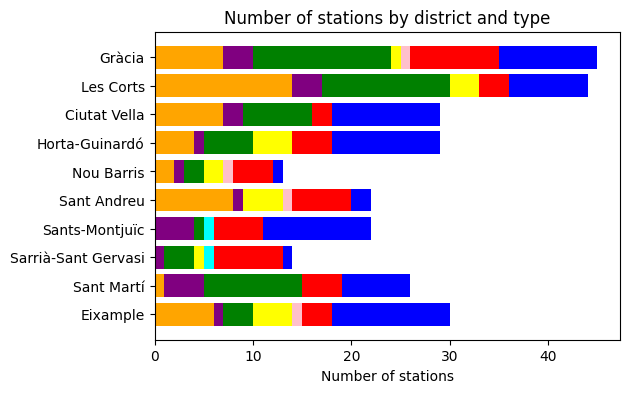

In [7]:
import numpy as np

def calculate_values(df):
    districts = df1['District'].tolist()
    airport_train = df1['Airport Train'].tolist()
    funicular = df1['Funicular'].tolist()
    railway_fgc = df1['Railway (FGC)'].tolist()
    tram = df1['Tram'].tolist()
    cableway = df1['Cableway'].tolist()
    maritime_station = df1['Maritime Station'].tolist()
    renfe = df1['RENFE'].tolist()
    underground = df1['Underground'].tolist()

    return districts, airport_train, funicular, railway_fgc, tram, cableway, maritime_station, renfe, underground

# used a sample 
df1 = pd.DataFrame({
    'District': ['Eixample', 'Sant Martí', 'Sarrià-Sant Gervasi', 'Sants-Montjuïc', 'Sant Andreu', 'Nou Barris', 'Horta-Guinardó', 'Ciutat Vella', 'Les Corts', 'Gràcia'],
    'Airport Train': np.random.randint(0, 15, size=10),
    'Funicular': np.random.randint(0, 5, size=10),
    'Railway (FGC)': np.random.randint(0, 15, size=10),
    'Tram': np.random.randint(0, 5, size=10),
    'Cableway': np.random.randint(0, 2, size=10),
    'Maritime Station': np.random.randint(0, 2, size=10),
    'RENFE': np.random.randint(0, 10, size=10),
    'Underground': np.random.randint(0, 15, size=10)
})

districts, airport_train, funicular, railway_fgc, tram, cableway, maritime_station, renfe, underground = calculate_values(df)

fig, ax = plt.subplots(figsize=(6,4))
ax.barh(districts, airport_train, color='#FFA500', label='Airport train')
ax.barh(districts, funicular, left=airport_train, color='#800080', label='Funicular')
ax.barh(districts, railway_fgc, left=[x+y for x,y in zip(airport_train, funicular)], color='#008000', label='Railway (FGC)')
ax.barh(districts, tram, left=[x+y+z for x,y,z in zip(airport_train, funicular, railway_fgc)], color='#FFFF00', label='Tram')
ax.barh(districts, cableway, left=[x+y+z+w for x,y,z,w in zip(airport_train, funicular, railway_fgc, tram)], color='#FFC0CB', label='Cableway')
ax.barh(districts, maritime_station, left=[x+y+z+w+u for x,y,z,w,u in zip(airport_train, funicular, railway_fgc, tram, cableway)], color='#00FFFF', label='Maritime station')
ax.barh(districts, renfe, left=[x+y+z+w+u+v for x,y,z,w,u,v in zip(airport_train, funicular, railway_fgc, tram, cableway, maritime_station)], color='#FF0000', label='RENFE')
ax.barh(districts, underground, left=[x+y+z+w+u+v+r for x,y,z,w,u,v,r in zip(airport_train, funicular, railway_fgc, tram, cableway, maritime_station, renfe)], color='#0000FF', label='Underground')

ax.set_xlabel('Number of stations')
ax.set_title('Number of stations by district and type')


plot_pane = pn.pane.Matplotlib(fig, tight=True)

In [8]:

dashboard = pn.Column(
    pn.pane.Markdown("## Barcelona Transport Directory", sizing_mode="stretch_width"),
    welcome_panel,
    pn.Row(district_dropdown, transport_dropdown),
    pn.Row(map_pane, message_pane),
    pn.Row(plot_pane),
    conclusion_panel,
)

# Serve the dashboard
#dashboard.servable()

In [9]:
#from bokeh.resources import INLINE
#dashboard.save('/Users/siddarthrathinam/Documents/ENVS456/dashboard.html', embed=True, resources=INLINE)


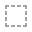
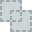
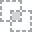
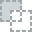
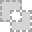
...
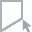
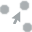
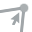
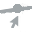
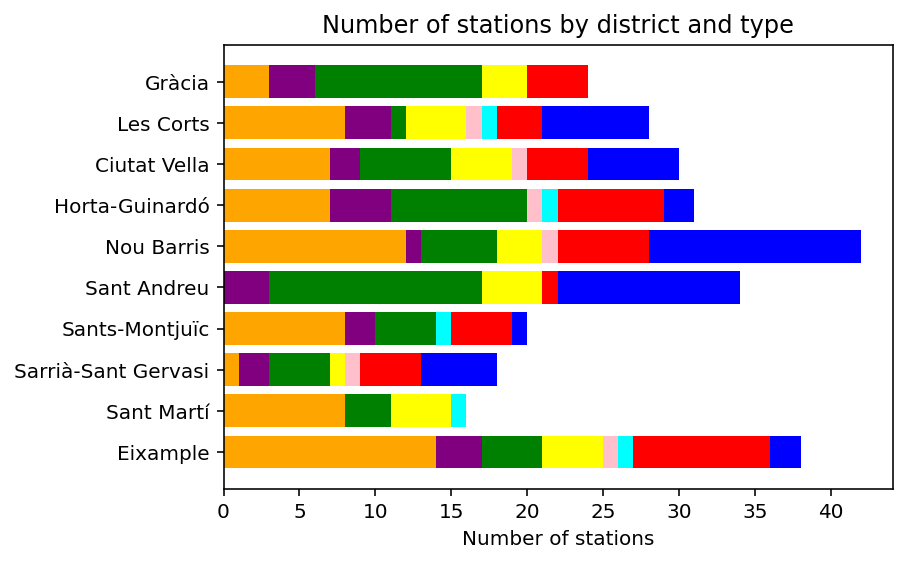

In [10]:
from IPython.display import HTML

# Assuming 'example.html' is your HTML file
with open('/Users/siddarthrathinam/Documents/ENVS456/dashboard.html', 'r') as file:
    html_content = file.read()

# Display the HTML content in the notebook
HTML(html_content)

In conclusion, this assessment aims to provide supportive evidence for the assertion that the best mode of transportation in the city of Barcelona is the underground system. Through various analyses and visualizations, we have endeavored to demonstrate the efficiency and effectiveness of the underground network compared to other transport options available in the city. 